# Problem 1: Speech Denoising Using Deep Learning

In [25]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization
from tensorflow.keras.initializers import he_normal
import numpy as np
import librosa
import soundfile as sf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, Flatten
from IPython.display import Audio, display
import matplotlib.pyplot as plt
import tarfile
import os
import pickle
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.initializers import he_normal

In [8]:
from google.colab import files
uploaded = files.upload()

Saving test_s_01.wav to test_s_01.wav
Saving test_x_01.wav to test_x_01.wav
Saving test_x_02.wav to test_x_02.wav
Saving train_clean_male.wav to train_clean_male.wav
Saving train_dirty_male.wav to train_dirty_male.wav


In [9]:
s, sr = librosa.load('train_clean_male.wav', sr=None)
sn, sr = librosa.load('train_dirty_male.wav', sr=None)
t, sr = librosa.load('test_x_01.wav', sr=None)
u, sr = librosa.load('test_s_01.wav', sr=None)

S = librosa.stft(s, n_fft=1024, hop_length=512)
X = librosa.stft(sn, n_fft=1024, hop_length=512)


print(S.shape)
print(X.shape)

import numpy as np
magnitude_S = np.abs(S)
magnitude_X = np.abs(X)

(513, 2459)
(513, 2459)


In [10]:
print(magnitude_S.shape)
print(magnitude_X.shape)

(513, 2459)
(513, 2459)


In [11]:

# Define a fully-connected neural network
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(513,)),  # Input layer with 513-dimensional input
    tf.keras.layers.Dense(256, activation='relu'),  # First hidden layer with ReLU activation
    tf.keras.layers.Dense(128, activation='relu'),  # Second hidden layer with ReLU activation
    tf.keras.layers.Dense(513, activation='relu'),  # Output layer with softplus activation
])

In [12]:
# Compile the model with Mean Squared Error (MSE) loss for regression
model.compile(optimizer='adam', loss='mse')

model.fit(magnitude_X.T, magnitude_S.T, epochs=300, batch_size=32)

Epoch 1/300
77/77 [==============================] - 6s 3ms/step - loss: 0.0574
Epoch 2/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0264
Epoch 3/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0183
Epoch 4/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0146
Epoch 5/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0130
Epoch 6/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0117
Epoch 7/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0111
Epoch 8/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0100
Epoch 9/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0095
Epoch 10/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0091
Epoch 11/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0089
Epoch 12/300
77/77 [==============================] - 0s 2ms/step - loss: 0.0086
Epoch 13/300
77/77 [=================

In [14]:
t, sr = librosa.load('test_x_01.wav', sr=None)
test_X =librosa.stft(t, n_fft=1024, hop_length=512)
magnitude_test_X = np.abs(test_X)

# Predict the cleaned magnitude spectrogram
S_test_cleaned = model.predict(magnitude_test_X.T)

# Compute the modified magnitude spectrogram
S_test = np.multiply((test_X) / magnitude_test_X, S_test_cleaned.T)

# Define STFT parameters
n_fft = 1024  # Example value, adjust based on your STFT parameters
hop_length = 512  # Example value, adjust based on your STFT parameters

# Reconstruct the time-domain signal using inverse STFT
reconstructed_signal = librosa.istft(S_test, hop_length=hop_length, win_length=n_fft)

# Output file path for the denoised audio
output_file_path = 'denoised_output.wav'

# Write the denoised audio signal to a WAV file
sf.write(output_file_path, reconstructed_signal, sr)

# Load the clean test audio
u, sr = librosa.load('test_s_01.wav', sr=None)

# Compute the clean magnitude spectrogram
clean_S = librosa.stft(u, n_fft=n_fft, hop_length=hop_length)

# Reconstruct the clean time-domain signal using inverse STFT
inverse_S_clean = librosa.istft(clean_S, hop_length=hop_length, win_length=n_fft)

# Compute the Signal-to-Noise Ratio (SNR)
SNR = 10 * np.log10(np.sum((inverse_S_clean ** 2)) / (np.sum((inverse_S_clean - reconstructed_signal) ** 2) + 1e-20))
print("Signal-to-Noise Ratio (SNR): {:.2f} dB".format(SNR))

5/5 [==============================] - 0s 3ms/step
Signal-to-Noise Ratio (SNR): 8.03 dB


The SNR: 8.03 means we have successfully recovered the clean audio. Although, there is still noise present and it can be improved to achieve a higher SNR arounf 15.0

### Visualizing and playing the audios

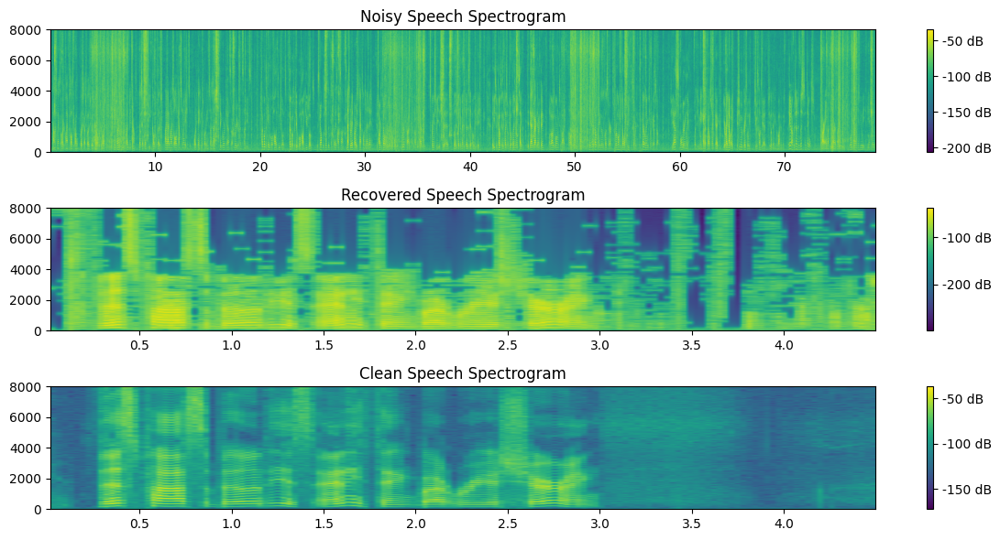

In [15]:
import matplotlib.pyplot as plt

# Plot the Noisy Speech Spectrogram
plt.figure(figsize=(12, 6))
plt.subplot(311)
plt.title('Noisy Speech Spectrogram')
plt.specgram(sn, NFFT=1024, Fs=sr, noverlap=512, cmap='viridis')
plt.colorbar(format='%+2.0f dB')

# Plot the Recovered Speech Spectrogram
plt.subplot(312)
plt.title('Recovered Speech Spectrogram')
plt.specgram(reconstructed_signal, NFFT=1024, Fs=sr, noverlap=512, cmap='viridis')
plt.colorbar(format='%+2.0f dB')

# Plot the Clean Speech Spectrogram
plt.subplot(313)
plt.title('Clean Speech Spectrogram')
plt.specgram(u, NFFT=1024, Fs=sr, noverlap=512, cmap='viridis')
plt.colorbar(format='%+2.0f dB')

plt.tight_layout()
plt.show()


### Playing the audio files of the noisy, recovered and clean speech

In [16]:
from IPython.display import Audio

# Play the Noisy Speech
display(Audio(sn, rate=sr))

# Play the Recovered Speech
display(Audio(reconstructed_signal, rate=sr))

# Play the Clean Speech
display(Audio(u, rate=sr))

# Problem 2: Speech Denoising Using 1D CNN

In [17]:
# Define the neural network model with Conv1D layers using the Keras functional API

input_layer = Input(shape=(513, 1))
x = Conv1D(filters=32, kernel_size=3, strides=2, activation='relu')(input_layer)
x = Conv1D(filters=64, kernel_size=3, strides=2, activation='relu')(x)
x = Flatten()(x)
output_layer = Dense(513, activation='relu', kernel_initializer=he_normal())(x)

conv_model= Model(inputs=input_layer, outputs=output_layer)

# Compile the modela
conv_model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])

# Print the model summary
conv_model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 513, 1)]          0         
                                                                 
 conv1d (Conv1D)             (None, 256, 32)           128       
                                                                 
 conv1d_1 (Conv1D)           (None, 127, 64)           6208      
                                                                 
 flatten (Flatten)           (None, 8128)              0         
                                                                 
 dense_3 (Dense)             (None, 513)               4170177   
                                                                 
Total params: 4176513 (15.93 MB)
Trainable params: 4176513 (15.93 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [18]:
conv_model.fit(magnitude_X.T, magnitude_S.T, epochs=300, batch_size=32)

Epoch 1/300
77/77 [==============================] - 6s 4ms/step - loss: 0.0439 - accuracy: 0.1655
Epoch 2/300
77/77 [==============================] - 0s 4ms/step - loss: 0.0163 - accuracy: 0.3664
Epoch 3/300
77/77 [==============================] - 0s 4ms/step - loss: 0.0117 - accuracy: 0.4136
Epoch 4/300
77/77 [==============================] - 0s 4ms/step - loss: 0.0093 - accuracy: 0.4575
Epoch 5/300
77/77 [==============================] - 0s 3ms/step - loss: 0.0082 - accuracy: 0.4774
Epoch 6/300
77/77 [==============================] - 0s 3ms/step - loss: 0.0074 - accuracy: 0.4888
Epoch 7/300
77/77 [==============================] - 0s 3ms/step - loss: 0.0066 - accuracy: 0.4994
Epoch 8/300
77/77 [==============================] - 0s 3ms/step - loss: 0.0061 - accuracy: 0.5148
Epoch 9/300
77/77 [==============================] - 0s 3ms/step - loss: 0.0056 - accuracy: 0.5250
Epoch 10/300
77/77 [==============================] - 0s 3ms/step - loss: 0.0054 - accuracy: 0.5303
Epoch 11/

In [19]:
# Predict the cleaned magnitude spectrogram
S_test_cleaned = conv_model.predict(magnitude_test_X.T)

# Compute the modified magnitude spectrogram
S_test = np.multiply((test_X) / magnitude_test_X, S_test_cleaned.T)

# Define STFT parameters
n_fft = 1024  # Example value, adjust based on your STFT parameters
hop_length = 512  # Example value, adjust based on your STFT parameters

# Reconstruct the time-domain signal using inverse STFT
reconstructed_signal = librosa.istft(S_test, hop_length=hop_length, win_length=n_fft)

# Output file path for the denoised audio
output_file_path = 'denoised_output.wav'

# Write the denoised audio signal to a WAV file
sf.write(output_file_path, reconstructed_signal, sr)

# Load the clean test audio
u, sr = librosa.load('test_s_01.wav', sr=None)

# Compute the clean magnitude spectrogram
clean_S = librosa.stft(u, n_fft=n_fft, hop_length=hop_length)

# Reconstruct the clean time-domain signal using inverse STFT
inverse_S_clean = librosa.istft(clean_S, hop_length=hop_length, win_length=n_fft)

# Compute the Signal-to-Noise Ratio (SNR)
SNR = 10 * np.log10(np.sum((inverse_S_clean ** 2)) / (np.sum((inverse_S_clean - reconstructed_signal) ** 2) + 1e-20))
print("Signal-to-Noise Ratio (SNR): {:.2f} dB".format(SNR))

5/5 [==============================] - 0s 6ms/step
Signal-to-Noise Ratio (SNR): 11.27 dB


An SNR of 11.27 is showing a significant improvement in the quality of the recovered audio compared to the noisy audio. However, it can be improved and bumped upto 15.

### Visualizing and playing the audio

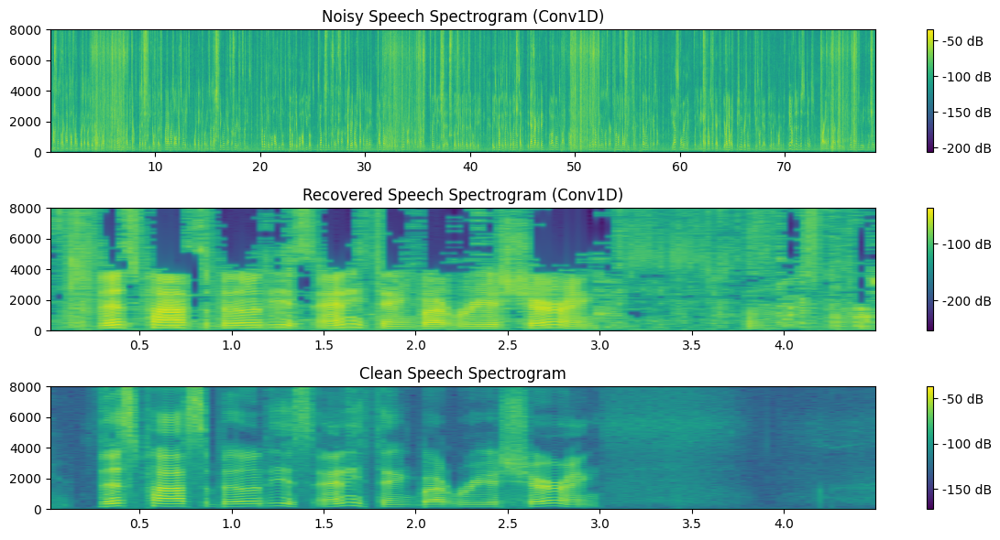

In [20]:
# Now, let's visualize and play the audio

# Plot the Noisy Speech Spectrogram
plt.figure(figsize=(12, 6))
plt.subplot(311)
plt.title('Noisy Speech Spectrogram (Conv1D)')
plt.specgram(sn, NFFT=1024, Fs=sr, noverlap=512, cmap='viridis')
plt.colorbar(format='%+2.0f dB')

# Plot the Recovered Speech Spectrogram
plt.subplot(312)
plt.title('Recovered Speech Spectrogram (Conv1D)')
plt.specgram(reconstructed_signal, NFFT=1024, Fs=sr, noverlap=512, cmap='viridis')
plt.colorbar(format='%+2.0f dB')

# Plot the Clean Speech Spectrogram
plt.subplot(313)
plt.title('Clean Speech Spectrogram')
plt.specgram(u, NFFT=1024, Fs=sr, noverlap=512, cmap='viridis')
plt.colorbar(format='%+2.0f dB')

plt.tight_layout()
plt.show()


In [21]:

# Play the Noisy Speech
display(Audio(sn, rate=sr))

# Play the Recovered Speech
display(Audio(reconstructed_signal, rate=sr))

# Play the Clean Speech
display(Audio(u, rate=sr))


# Problem 3: Data Augmentation

In [22]:
# Functions to load and preprocess CIFAR-10 data
def load_and_preprocess_cifar_data():
    (x_train, y_train), (x_test, y_test) = cifar10.load_data()

    # Number of images to set aside for validation
    validation_size = 5000

    # Split x_train and y_train into training and validation sets
    X_validation = x_train[:validation_size]
    y_validation = y_train[:validation_size]

    X_train = x_train[validation_size:]
    y_train = y_train[validation_size:]

    # Normalize the data to the range [-1, 1]
    X_train_normalized = (X_train / 127.5) - 1
    X_validation_normalized = (X_validation / 127.5) - 1
    X_test_normalized = (x_test / 127.5) - 1

    return X_train_normalized, y_train, X_validation_normalized, y_validation, X_test_normalized, y_test

# Build a CNN model for the baseline
def build_baseline_cnn_model(input_shape):
    input_layer = Input(shape=input_shape)
    conv1 = Conv2D(10, (5, 5), strides=(1, 1), kernel_initializer=he_normal(), activation='relu')(input_layer)
    pool1 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(conv1)
    conv2 = Conv2D(10, (5, 5), strides=(1, 1), kernel_initializer=he_normal(), activation='relu')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(conv2)
    flatten = Flatten()(pool2)
    fc1 = Dense(20, activation='relu', kernel_initializer=he_normal())(flatten)
    output_layer = Dense(10, activation='softmax', kernel_initializer=he_normal())(fc1)
    model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Function to plot validation accuracy
def plot_validation_accuracy(history):
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['val_accuracy'])
    plt.title('Validation Accuracy Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.grid(True)
    plt.show()

Epoch 1/100
1407/1407 [==============================] - 7s 4ms/step - loss: 1.6703 - accuracy: 0.3890 - val_loss: 1.4479 - val_accuracy: 0.4786
Epoch 2/100
1407/1407 [==============================] - 5s 4ms/step - loss: 1.3796 - accuracy: 0.5020 - val_loss: 1.3362 - val_accuracy: 0.5148
Epoch 3/100
1407/1407 [==============================] - 5s 4ms/step - loss: 1.2971 - accuracy: 0.5347 - val_loss: 1.2683 - val_accuracy: 0.5526
Epoch 4/100
1407/1407 [==============================] - 6s 4ms/step - loss: 1.2265 - accuracy: 0.5618 - val_loss: 1.2044 - val_accuracy: 0.5756
Epoch 5/100
1407/1407 [==============================] - 6s 4ms/step - loss: 1.1708 - accuracy: 0.5854 - val_loss: 1.1453 - val_accuracy: 0.6060
Epoch 6/100
1407/1407 [==============================] - 6s 4ms/step - loss: 1.1386 - accuracy: 0.5961 - val_loss: 1.1651 - val_accuracy: 0.5902
Epoch 7/100
1407/1407 [==============================] - 5s 4ms/step - loss: 1.1066 - accuracy: 0.6083 - val_loss: 1.1431 - val_ac

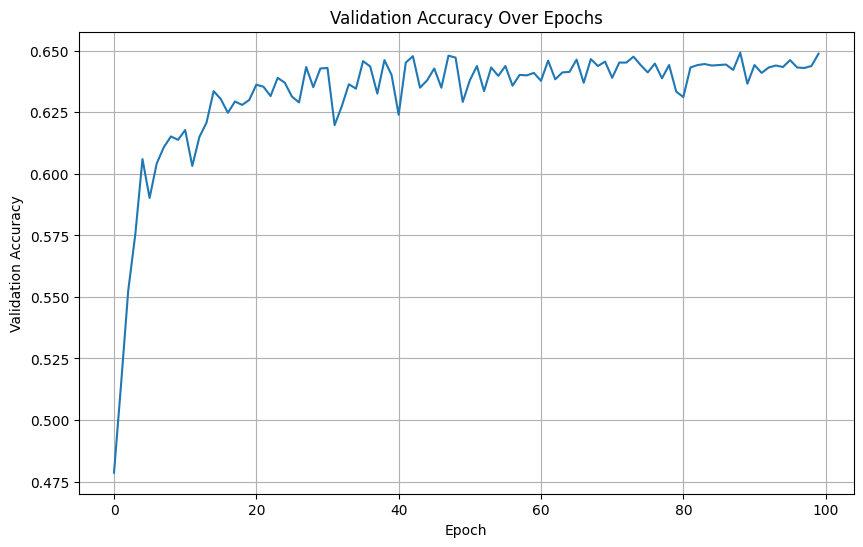

In [28]:
if __name__ == "__main__":
    X_train, y_train, X_validation, y_validation, X_test, y_test = load_and_preprocess_cifar_data()

    # Build and train the baseline CNN model
    baseline_model = build_baseline_cnn_model(X_train.shape[1:])
    baseline_history = baseline_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_validation, y_validation))
    plot_validation_accuracy(baseline_history)

In [27]:
# Initialize an empty list to store augmented data
augmented_data = []

# Data augmentation: Brighten, darken, and flip horizontally
augmentation_1 = np.minimum(1.1 * X_train, 1)
augmentation_2 = 0.9 * X_train
augmentation_3 = np.flip(X_train, axis=2)
augmentation_4 = X_train

# Append augmented data to the list if not empty
if augmentation_1.size > 0:
    augmented_data.append(augmentation_1)
if augmentation_2.size > 0:
    augmented_data.append(augmentation_2)
if augmentation_3.size > 0:
    augmented_data.append(augmentation_3)
if augmentation_4.size > 0:
    augmented_data.append(augmentation_4)

# Concatenate the augmented data in smaller batches (e.g., 5000 samples per batch)
batch_size = 5000
num_samples = len(X_train)
merged_augmented_data = []

for i in range(0, len(augmented_data), batch_size):
    batch_data = np.concatenate(augmented_data[i:i + batch_size], axis=0)
    merged_augmented_data.append(batch_data)

# Concatenate the batches
merged_augmented_data = np.concatenate(merged_augmented_data, axis=0)

# Rescale the merged augmented data
merged_augmented_data_new = (merged_augmented_data + 1) / 2


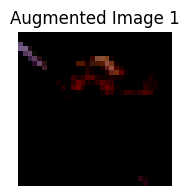

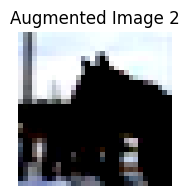

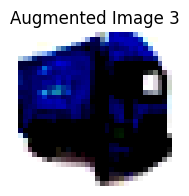

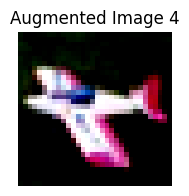

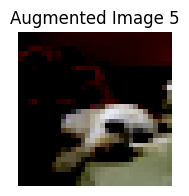

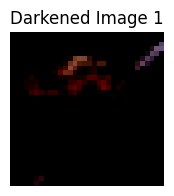

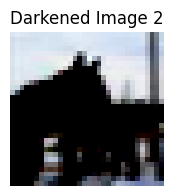

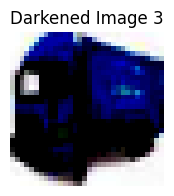

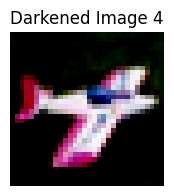

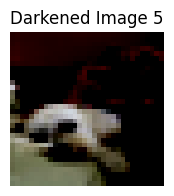

In [29]:

# Visualize the first five images from augmentation 1 and 2
viz = 5
# from augmentation 1
for i in range(viz):
    plt.figure(figsize=(2, 2))
    plt.imshow(augmentation_1[i].reshape(32, 32, 3))  # Assuming the images are 32x32x3
    plt.axis('off')
    plt.title(f'Augmented Image {i+1}')
    plt.show()
# from augmentation 2
for i in range(viz):
    plt.figure(figsize=(2, 2))
    plt.imshow(augmentation_3[i].reshape(32, 32, 3))  # Assuming the images are 32x32x3
    plt.axis('off')
    plt.title(f'Darkened Image {i+1}')
    plt.show()

In [30]:
y_train_stacked = np.repeat(y_train, 4)

In [ ]:
    # Build and train a different CNN model for the augmented dataset
    augmented_model = build_baseline_cnn_model(X_train.shape[1:])
    augmented_history = augmented_model.fit(merged_augmented_data_new, y_train_stacked, epochs=100, batch_size=32, validation_data=(X_validation, y_validation))

    # plot accuracy
    plot_validation_accuracy(augmented_history)

Epoch 1/100
5625/5625 [==============================] - 21s 3ms/step - loss: 2.3029 - accuracy: 0.0988 - val_loss: 2.3026 - val_accuracy: 0.0884
Epoch 2/100
5625/5625 [==============================] - 18s 3ms/step - loss: 2.3027 - accuracy: 0.1000 - val_loss: 2.3026 - val_accuracy: 0.1044
Epoch 3/100
5625/5625 [==============================] - 18s 3ms/step - loss: 2.3027 - accuracy: 0.0997 - val_loss: 2.3071 - val_accuracy: 0.0826
Epoch 4/100
5625/5625 [==============================] - 19s 3ms/step - loss: 2.3027 - accuracy: 0.0997 - val_loss: 2.3044 - val_accuracy: 0.0932
Epoch 5/100
5625/5625 [==============================] - 19s 3ms/step - loss: 2.3027 - accuracy: 0.1007 - val_loss: 2.3043 - val_accuracy: 0.1052
Epoch 6/100
5625/5625 [==============================] - 19s 3ms/step - loss: 2.3027 - accuracy: 0.1005 - val_loss: 2.3040 - val_accuracy: 0.1086
Epoch 7/100
5625/5625 [==============================] - 19s 3ms/step - loss: 2.3027 - accuracy: 0.1001 - val_loss: 2.3042 -

Epoch 1/100
5625/5625 [==============================] - 18s 3ms/step - loss: 2.3029 - accuracy: 0.1001 - val_loss: 2.4073 - val_accuracy: 0.1430
Epoch 2/100
5625/5625 [==============================] - 17s 3ms/step - loss: 2.3028 - accuracy: 0.1006 - val_loss: 3.7012 - val_accuracy: 0.1044
Epoch 3/100
5625/5625 [==============================] - 16s 3ms/step - loss: 2.3027 - accuracy: 0.1003 - val_loss: 7.9439 - val_accuracy: 0.1168
Epoch 4/100
5625/5625 [==============================] - 16s 3ms/step - loss: 2.3028 - accuracy: 0.0990 - val_loss: 7.7689 - val_accuracy: 0.0990
Epoch 5/100
5625/5625 [==============================] - 17s 3ms/step - loss: 2.3027 - accuracy: 0.0985 - val_loss: 11.9346 - val_accuracy: 0.0940
Epoch 6/100
5625/5625 [==============================] - 16s 3ms/step - loss: 2.3027 - accuracy: 0.0993 - val_loss: 12.0893 - val_accuracy: 0.1082
Epoch 7/100
5625/5625 [==============================] - 16s 3ms/step - loss: 2.3025 - accuracy: 0.1005 - val_loss: 15.875

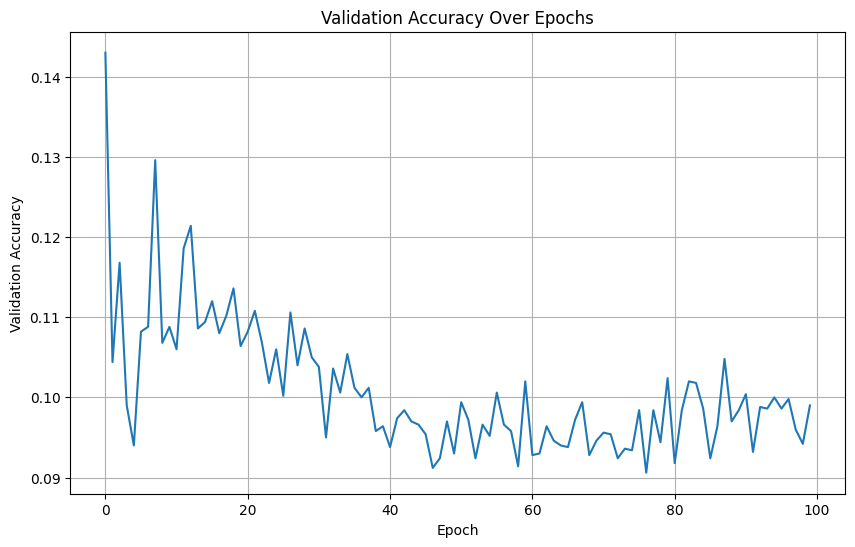

In [ ]:
    # Build and train a different CNN model for the augmented dataset
    augmented_model = build_baseline_cnn_model(X_train.shape[1:])
    augmented_history = augmented_model.fit(merged_augmented_data_new, y_train_stacked, epochs=100, batch_size=32, validation_data=(X_validation, y_validation))

    plot_validation_accuracy(augmented_history)

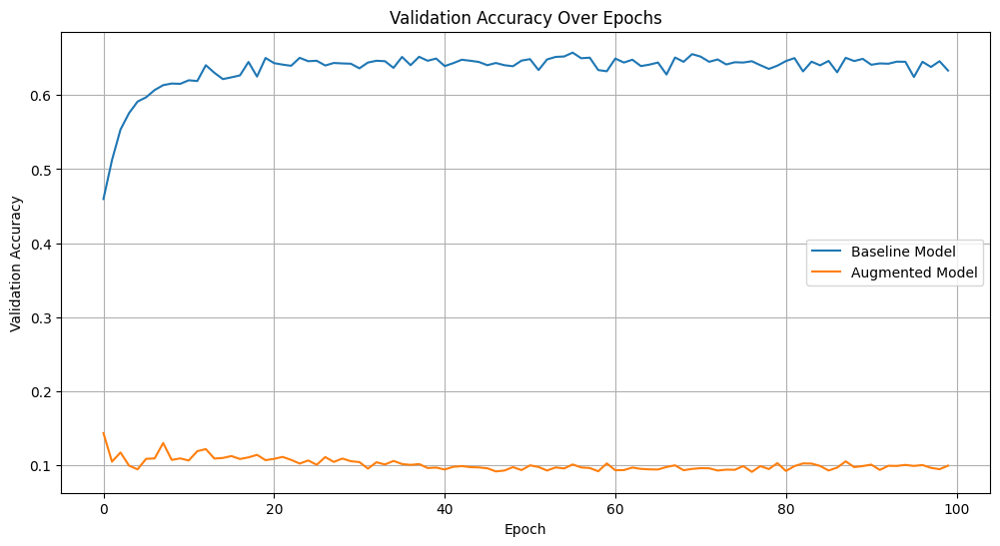

In [ ]:
# Plot validation accuracy for both baseline and augmented models
plt.figure(figsize=(12, 6))
plt.plot(baseline_history.history['val_accuracy'], label='Baseline Model')
plt.plot(augmented_history.history['val_accuracy'], label='Augmented Model')
plt.title('Validation Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()


# Problem 4: Self-Supervised Learning via Pretext Tasks

In [ ]:
from tensorflow import keras
from tqdm import tqdm

(x_data, y_data), (x_test, y_test) = keras.datasets.cifar10.load_data()

In [ ]:

# Separate the last 500 data points as the baseline
x_base = x_data[-500:]
y_base = y_data[-500:]

# Use the remaining data for pretext
x_pre = x_data[:-500]
y_pre = y_data[:-500]

# Apply vertical flip to the images in the pretext dataset
x_flipped = [np.flipud(img) for img in x_pre]

# Rotate the images 90 degrees in the pretext dataset
x_rotated = [np.rot90(img) for img in x_pre]

# Convert the flipped and rotated images to NumPy arrays
x_flipped_np = np.array(x_flipped)
x_rotated_np = np.array(x_rotated)

# Concatenate the original, flipped, and rotated images in the pretext dataset
x_pretext_combined = np.vstack((x_pre, x_rotated_np, x_flipped_np))

# Create labels for the pretext dataset
num_samples = x_pretext_combined.shape[0]
y_0 = np.zeros((49500,1))
y_1 = np.ones((49500,1))
y_2 = np.ones((49500,1))*2

y_pretext_final = np.vstack((y_0,y_1,y_2))

# Rescale the images in the pretext dataset to the range [-1, 1]
x_pretext_combined = (x_pretext_combined - 127.5) / 127.5
y_pretext_combined = np.vstack((y_0,y_1,y_2))

In [ ]:
# rescaling
x_base_rescaled = (x_base/255.0) * 2-1
x_test_rescaled = (x_test/255.0) * 2-1

In [ ]:

# Create the model
base_model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(10, (5, 5), input_shape=(32, 32, 3), kernel_initializer='he_normal'),
    tf.keras.layers.MaxPooling2D(2),
    tf.keras.layers.Conv2D(10, (5, 5), kernel_initializer='he_normal'),
    tf.keras.layers.MaxPooling2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(20, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.Dense(10, activation='softmax')
])

# Compile the model
base_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


In [ ]:
base_results = base_model.fit(
    x_base_rescaled,y_base, epochs=10000,
    batch_size=500, validation_batch_size = 2500, validation_data = (x_test_rescaled, y_test)
    )

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 86ms/step - loss: 1.2739e-06 - accuracy: 1.0000 - val_loss: 13.7263 - val_accuracy: 0.3135
Epoch 7502/10000
1/1 [==============================] - 0s 99ms/step - loss: 1.2729e-06 - accuracy: 1.0000 - val_loss: 13.7268 - val_accuracy: 0.3135
Epoch 7503/10000
1/1 [==============================] - 0s 84ms/step - loss: 1.2720e-06 - accuracy: 1.0000 - val_loss: 13.7273 - val_accuracy: 0.3135
Epoch 7504/10000
1/1 [==============================] - 0s 91ms/step - loss: 1.2715e-06 - accuracy: 1.0000 - val_loss: 13.7278 - val_accuracy: 0.3135
Epoch 7505/10000
1/1 [==============================] - 0s 85ms/step - loss: 1.2708e-06 - accuracy: 1.0000 - val_loss: 13.7283 - val_accuracy: 0.3135
Epoch 7506/10000
1/1 [==============================] - 0s 91ms/step - loss: 1.2696e-06 - accuracy: 1.0000 - val_loss: 13.7289 - val_accuracy: 0.3135
Epoch 7507/10000
1/1 [==============================] - 0s 92ms/st

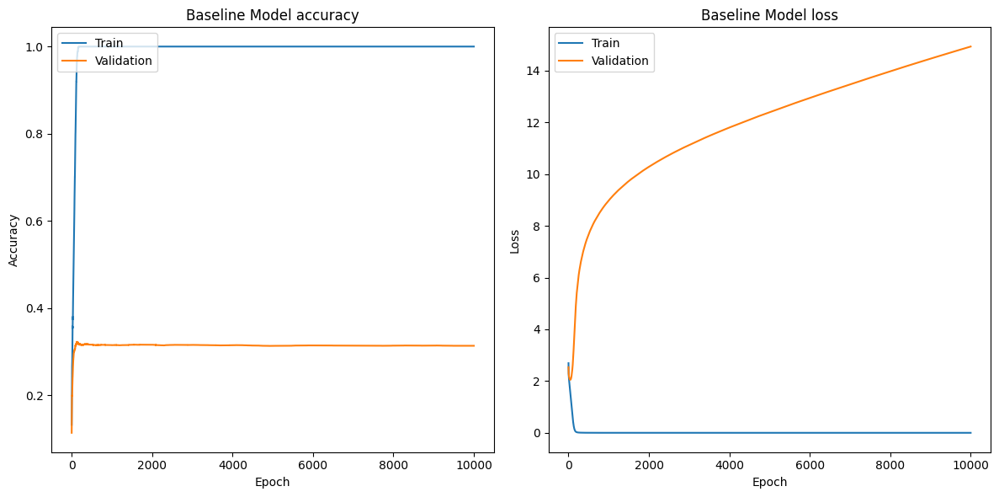

In [ ]:
# plots for baseline model
# Access the history from the base model training
base_history = base_results.history

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(base_history['accuracy'])
plt.plot(base_history['val_accuracy'])
plt.title('Baseline Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(base_history['loss'])
plt.plot(base_history['val_loss'])
plt.title('Baseline Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
base_model.save("base_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Pretext model

In [ ]:
import tensorflow as tf

# Create the model
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(10, (5, 5), input_shape=(32, 32, 3), kernel_initializer='he_normal'),
    tf.keras.layers.MaxPooling2D(2),
    tf.keras.layers.Conv2D(10, (5, 5), kernel_initializer='he_normal'),
    tf.keras.layers.MaxPooling2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(20, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


In [ ]:
results = model.fit(
    x_pretext_combined,y_pretext_combined,
    batch_size=64,
    epochs=100)

Epoch 1/100
2321/2321 [==============================] - 9s 3ms/step - loss: 0.8849 - accuracy: 0.5849
Epoch 2/100
2321/2321 [==============================] - 8s 3ms/step - loss: 0.7748 - accuracy: 0.6553
Epoch 3/100
2321/2321 [==============================] - 8s 3ms/step - loss: 0.7362 - accuracy: 0.6764
Epoch 4/100
2321/2321 [==============================] - 8s 3ms/step - loss: 0.7103 - accuracy: 0.6892
Epoch 5/100
2321/2321 [==============================] - 8s 3ms/step - loss: 0.6887 - accuracy: 0.7007
Epoch 6/100
2321/2321 [==============================] - 8s 3ms/step - loss: 0.6719 - accuracy: 0.7095
Epoch 7/100
2321/2321 [==============================] - 8s 3ms/step - loss: 0.6610 - accuracy: 0.7137
Epoch 8/100
2321/2321 [==============================] - 8s 3ms/step - loss: 0.6501 - accuracy: 0.7200
Epoch 9/100
2321/2321 [==============================] - 8s 3ms/step - loss: 0.6415 - accuracy: 0.7251
Epoch 10/100
2321/2321 [==============================] - 8s 3ms/step - l

In [ ]:
# saving pretext model to fine tune later
model.save("model.h5")

## Transfer learning and fine tuning

In [ ]:
import tensorflow_addons as tfa

# Load the weights from a pre-trained pretext model
pretext_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10, kernel_size=(5, 5), input_shape=(32, 32, 3), strides=(1, 1), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.MaxPool2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(10, kernel_size=(5, 5), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.MaxPool2D((2, 2), strides=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(20, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.Dense(10, activation=None, kernel_initializer='he_normal', name='last_layer')
])

# Load weights from the pretext model's pre-trained weights file
pretext_model.load_weights('model.h5')

# Define the main model with the same architecture as the pretext model
main_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10, kernel_size=(5, 5), input_shape=(32, 32, 3), strides=(1, 1), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.MaxPool2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(10, kernel_size=(5, 5), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.MaxPool2D((2, 2), strides=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(20, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.Dense(10, activation=None, kernel_initializer='he_normal')
])

# Transfer weights from the pretext model to the main model
for i in range(len(main_model.layers)):
    main_model.layers[i].set_weights(pretext_model.layers[i].get_weights())

# Define optimizers for the last layer and the remaining layers
optimizers = [
    tf.keras.optimizers.Adam(learning_rate=1e-6),
    tf.keras.optimizers.Adam(learning_rate=1e-3)
]
optimizers_and_layers = [(optimizers[0], main_model.layers[:-1]), (optimizers[1], main_model.layers[-1])]
optimizer = tfa.optimizers.MultiOptimizer(optimizers_and_layers)

# Compile the main model with MultiOptimizer and an appropriate loss function
main_model.compile(optimizer=optimizer, loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

main_model.summary()
history_main_model = main_model.fit(x_base_rescaled, y_base, epochs=10000, batch_size=500,
                                    validation_data=(x_test, y_test), validation_freq=250)


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 11ms/step - loss: 1.6443 - accuracy: 0.3660
Epoch 7502/10000
1/1 [==============================] - 0s 12ms/step - loss: 1.6443 - accuracy: 0.3660
Epoch 7503/10000
1/1 [==============================] - 0s 11ms/step - loss: 1.6443 - accuracy: 0.3660
Epoch 7504/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.6442 - accuracy: 0.3660
Epoch 7505/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.6442 - accuracy: 0.3660
Epoch 7506/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.6442 - accuracy: 0.3660
Epoch 7507/10000
1/1 [==============================] - 0s 12ms/step - loss: 1.6441 - accuracy: 0.3660
Epoch 7508/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.6441 - accuracy: 0.3660
Epoch 7509/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.6441 - accuracy: 0.3660
Epoch 7510/10000
1/1 [=================

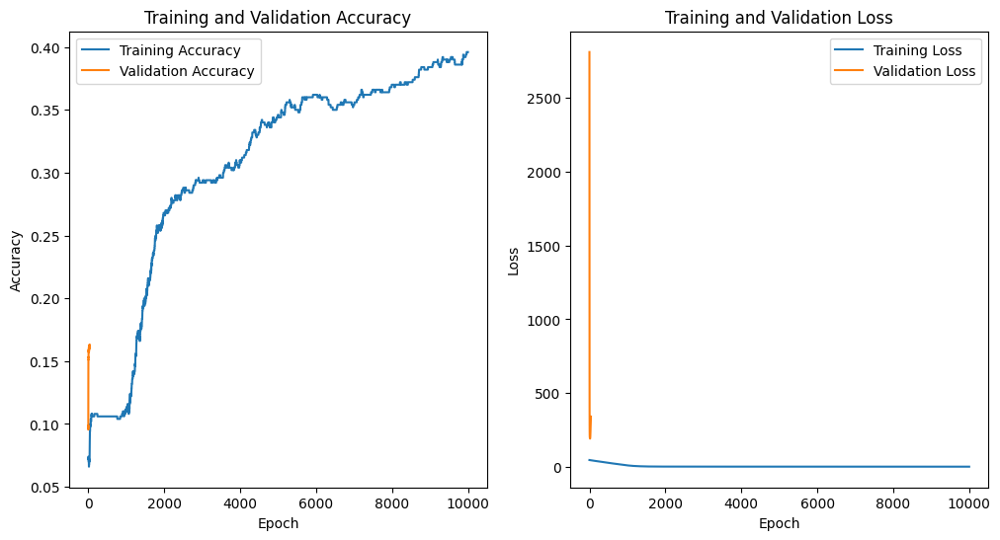

In [ ]:
# Main model plots

# Access the training history
training_accuracy = history_main_model.history['accuracy']
validation_accuracy = history_main_model.history['val_accuracy']

# Access the training loss
training_loss = history_main_model.history['loss']
validation_loss = history_main_model.history['val_loss']

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()



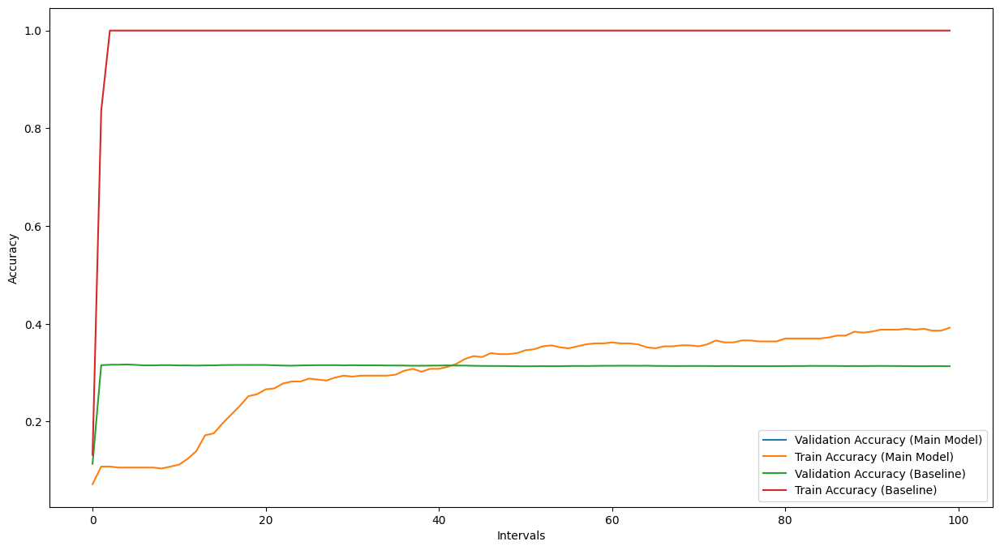

In [ ]:
# Comparing baseline and main model after dine tuning

# Plot the validation and training accuracy for the main model
plt.figure(figsize=(15, 8))  # Adjust the figsize here to make the graph larger
plt.plot(plot_interval_metrics(history_main_model.history['val_accuracy']), label='Validation Accuracy (Main Model)')
plt.plot(plot_interval_metrics(history_main_model.history['accuracy']), label='Train Accuracy (Main Model)')

# Plot the validation and training accuracy for the baseline model
plt.plot(plot_interval_metrics(base_history['val_accuracy']), label='Validation Accuracy (Baseline)')
plt.plot(plot_interval_metrics(base_history['accuracy']), label='Train Accuracy (Baseline)')

plt.ylabel('Accuracy')
plt.xlabel('Intervals')
plt.legend()

plt.show()


From the above graph, we can say that the baseline model is performing better than the fine tuned main model. This can be due to several reasons such as tuning of the hyperparameters or architecture of the sequential models. In the future, this can be made better by regukarization, more hyperparameter tuning or trying ensemble techniques.